# Required libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install numpy torch pillow torchvision opencv-python scikit-image matplotlib tqdm datasets diffusers transformers accelerate xformers kornia huggingface_hub

INFO: pip is looking at multiple versions of xformers to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.9/484.9 k

In [3]:
import numpy as np
import torch
from PIL import Image
import kornia.color as kcolor
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder
import random
import os
import cv2
import skimage.color as color
from skimage.color import lab2rgb
from matplotlib import pyplot as plt
from tqdm.auto import tqdm
from datasets import load_dataset
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionControlNetImg2ImgPipeline,
    StableDiffusionControlNetPipeline,
    DPMSolverMultistepScheduler,
    UniPCMultistepScheduler,
    DDIMScheduler,
    DDPMPipeline
)
from diffusers.models import UNet2DConditionModel
from diffusers import ControlNetModel
from transformers import BlipProcessor, BlipForConditionalGeneration
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random
from peft import LoraConfig, get_peft_model
import copy

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [4]:
device = 'mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')

Using device: cuda


In [5]:
!nvidia-smi

Fri Feb 14 18:40:23 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P0             48W /  400W |       5MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

# Download of datasets

Alternative dataset based on ImageNet with reduced resolution and/or the number of samples and labels.
Original ImageNet dataset is ~160GB.

In [6]:
dataset = torchvision.datasets.Imagenette(root="imagenette/", split='val', size='full', download=True)

100%|██████████| 1.56G/1.56G [00:33<00:00, 46.3MB/s]


Extracting imagenette/imagenette2.tgz to imagenette/


In [7]:
dataset.classes

[('tench', 'Tinca tinca'),
 ('English springer', 'English springer spaniel'),
 ('cassette player',),
 ('chain saw', 'chainsaw'),
 ('church', 'church building'),
 ('French horn', 'horn'),
 ('garbage truck', 'dustcart'),
 ('gas pump', 'gasoline pump', 'petrol pump', 'island dispenser'),
 ('golf ball',),
 ('parachute', 'chute')]

Download of the ImageNet_validation dataset with 1k categories.
Since of the validation dataset we need a smaller percentage of the dataset, we've decided to exploit `streaming=True` and taking 1000 samples.

In [8]:
from huggingface_hub import login

login("VALID_ACCESS_TOKEN")

In [9]:
# Load dataset in streaming mode
validation_dataset = load_dataset("timm/imagenet-1k-wds", split="validation", streaming=True)

# Take only the first 1000 samples
small_dataset = validation_dataset.take(1000)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/6.30k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/1024 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/64 [00:00<?, ?it/s]

# Training dataset

## Helper functions for Dataset creation

In [10]:
def is_black_and_white(img):
    #Check if an image is grayscale by comparing RGB channels.
    img_array = np.array(img)
    if len(img_array.shape) < 3 or img_array.shape[2] != 3:
        return True  # Already grayscale
    return np.all(img_array[:, :, 0] == img_array[:, :, 1]) and np.all(img_array[:, :, 1] == img_array[:, :, 2])

In [11]:
def mean_saturation(img):
    #Calculate the mean saturation of an image in HSV color space.
    img_hsv = img.convert('HSV')
    np_hsv = np.array(img_hsv)
    return np.mean(np_hsv[:, :, 1]) / 255.0  # Normalize to [0, 1]

## RGB dataset composition and captioning

In [12]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large").to(device)

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

In [13]:
class PreprocessedImagenette(Dataset):
    def __init__(self, root, image_size):
        self.dataset = torchvision.datasets.ImageFolder(root=root)
        self.image_size = image_size

        # Augmentations as per paper specifications
        self.augment = A.Compose([
            # Basic augmentations for 10% of samples
            A.OneOf([
                A.MotionBlur(blur_limit=5),
                A.GaussianBlur(blur_limit=(3, 7)),
            ], p=0.1),

            # Contrast and brightness changes for 10% of samples
            A.RandomBrightnessContrast(
                brightness_limit=0.1,    # Range of 0.9-1.1
                contrast_limit=0.2,      # Range of 0.8-1.2
                p=0.1
            ),

            # Chroma boost for 10% of samples
            A.ColorJitter(
                brightness=0,
                contrast=0,
                saturation=0.2,  # Range of 1.0-1.2
                hue=0,
                p=0.1
            ),

            A.OneOf([ #This is applied with 40% of probability both
              A.ColorJitter(
                  brightness=0,
                  contrast=0,
                  saturation=0.4,
                  hue=0,
                  p=1.0
              ),
              A.HueSaturationValue(
                  hue_shift_limit=0,
                  sat_shift_limit=50,
                  val_shift_limit=0,
                  p=1.0
              )
          ], p=0.4),

            ToTensorV2()
        ])

        # Normalization transform for VAE
        self.normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                           std=[0.5, 0.5, 0.5])

        self.resize = transforms.Resize((image_size, image_size))
        self.grayscale = kcolor.RgbToGrayscale()
        self.caption_model = model
        self.caption_processor = processor

        # Filter dataset
        self.filtered_data = []
        for img_path, _ in self.dataset.samples:
            img = Image.open(img_path).convert('RGB')
            if is_black_and_white(img) or mean_saturation(img) < 0.18:
                continue
            self.filtered_data.append(img_path)

    def __len__(self):
        return len(self.filtered_data)

    def __getitem__(self, idx):
        img_path = self.filtered_data[idx]
        img = Image.open(img_path).convert('RGB')

        # 1. Resize first
        img = self.resize(img)
        img_np = np.array(img)

        # 2. Apply augmentations
        augmented = self.augment(image=img_np)["image"]  # Returns tensor [0,255]

        # Convert to float and scale to [0,1]
        augmented = augmented.float() / 255.0

        # 3. Apply normalization to get [-1,1] range for VAE
        rgb_img = self.normalize(augmented)

        # 4. Create grayscale from normalized image
        grayscale_img = self.grayscale(rgb_img)

        # 5. Get caption using the interrogator
        inputs = self.caption_processor(
            img,  # Use original image for captioning
            return_tensors="pt"
        ).to(device)

        caption = self.caption_model.generate(
            **inputs,
            max_length=50,
            min_length=10,
            num_beams=5,
            temperature=0.5,
            top_p=0.9,
            repetition_penalty=1.5,
            no_repeat_ngram_size=3,
            do_sample=True
        )

        decoded_caption = self.caption_processor.tokenizer.decode(
            caption[0],
            skip_special_tokens=True
        )

        return rgb_img, grayscale_img, decoded_caption

In [14]:
custom_dataset = PreprocessedImagenette(root="imagenette/", image_size=224) # ~2min and 30 sec

In [15]:
sample_rgb, sample_gray, sample_caption = custom_dataset[45]

In [16]:
print(f"Caption: {sample_caption}")

Caption: guy holding a fish in his hands while sitting on the ground by the water


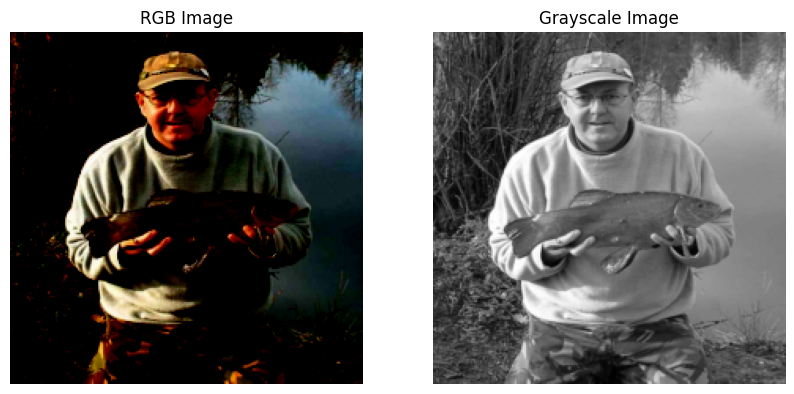

In [17]:
rgb_image_np = sample_rgb.permute(1, 2, 0).numpy()
# # Rescale from [-1, 1] to [0, 1] if necessary
# rgb_image_np = (rgb_image_np * 0.5) + 0.5  # Assuming normalization with mean=0.5, std=0.5
# rgb_image_np = rgb_image_np.clip(0, 1)
gray_image_np = sample_gray.squeeze(0).numpy()

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(rgb_image_np)
ax[0].set_title("RGB Image")
ax[0].axis("off")

ax[1].imshow(gray_image_np, cmap="gray")
ax[1].set_title("Grayscale Image")
ax[1].axis("off")
plt.show()

In [18]:
batch_size = 16

In [19]:
train_loader = DataLoader(custom_dataset,
                          batch_size=batch_size,
                          shuffle=True,
                          drop_last=True)

In [20]:
print(sample_rgb.min())
print(sample_rgb.max())

tensor(-0.9922)
tensor(1.)


# Validation set

 The dataset that is returned is a datasets.IterableDataset, not the classic map-style datasets.Dataset. To get examples from an iterable dataset, you have to iterate over it using a for loop for example.

In [21]:
first_1000_examples = []
for i, sample in enumerate(small_dataset):
    if i >= 1000:
        break
    first_1000_examples.append(sample)

In [22]:
first_1000_examples[0]

{'cls': 26,
 'jpg': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450>,
 'json': {'filename': 'n01630670/ILSVRC2012_val_00009670.JPEG',
  'height': 450,
  'label': 26,
  'width': 600},
 '__key__': 'ILSVRC2012_val_00009670',
 '__url__': 'hf://datasets/timm/imagenet-1k-wds@cdf403ce12f01022a0c36e584e588c0b9cebc4af/imagenet1k-validation-00.tar'}

In [23]:
print(len(first_1000_examples))

1000


In [24]:
class PreprocessedValidation(Dataset):
    def __init__(self, small_dataset, image_size, caption_model, caption_processor):
        self.dataset = small_dataset  # Hugging Face dataset (already filtered to 10%)
        self.image_size = image_size

        # Keep transforms separate for clarity
        self.resize = transforms.Resize((image_size, image_size))
        self.normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                           std=[0.5, 0.5, 0.5])
        self.grayscale = kcolor.RgbToGrayscale()

        self.caption_model = caption_model
        self.caption_processor = caption_processor

        # Filtering: Remove black & white or low-saturation images
        self.filtered_data = []
        for sample in self.dataset:
            img = sample["jpg"].convert("RGB")
            if not is_black_and_white(img) and mean_saturation(img) >= 0.18:
                self.filtered_data.append(sample)

    def __len__(self):
        return len(self.filtered_data)

    def __getitem__(self, idx):
        sample = self.filtered_data[idx]
        img = sample["jpg"].convert("RGB")

        # 1. Resize first
        img = self.resize(img)

        # 2. Convert to tensor
        rgb_img = transforms.ToTensor()(img)

        # 3. Apply normalization to get [-1,1] range for VAE
        rgb_img = self.normalize(rgb_img)

        # 4. Create grayscale from normalized image
        grayscale_img = self.grayscale(rgb_img)

        # 5. Generate caption
        inputs = self.caption_processor(
            img,  # Use original image for captioning
            return_tensors="pt"
        ).to(device)

        caption = self.caption_model.generate(
            **inputs,
            max_length=50,
            min_length=10,
            num_beams=5,
            temperature=0.5,
            top_p=0.9,
            repetition_penalty=1.5,
            no_repeat_ngram_size=3,
            do_sample=True
        )

        decoded_caption = self.caption_processor.tokenizer.decode(
            caption[0],
            skip_special_tokens=True
        )

        return rgb_img, grayscale_img, decoded_caption

In [25]:
preprocessed_dataset = PreprocessedValidation(first_1000_examples, 224, model, processor)

In [26]:
rgb, gray, caption = preprocessed_dataset[80]
print(caption)

some glass vases are sitting on a white shelf in a room


In [27]:
val_loader = DataLoader(preprocessed_dataset,
                        batch_size=batch_size,
                        shuffle=True,
                        drop_last=True)

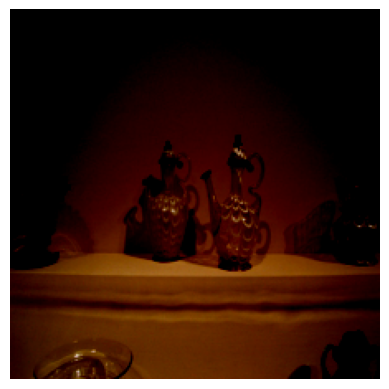

In [28]:
rgb_image_np = rgb.permute(1, 2, 0).cpu().numpy()  # Take first image in batch

# Rescale from [-1, 1] to [0, 1] if necessary
# rgb_image_np = (rgb_image_np * 0.5) + 0.5  # Assuming normalization with mean=0.5, std=0.5
# rgb_image_np = rgb_image_np.clip(0, 1)

# Display the image
plt.imshow(rgb_image_np)
plt.axis("off")
plt.show()

In [29]:
print(rgb.min())

tensor(-0.9765)


In [30]:
print(rgb.max())

tensor(0.8667)


# Defining the model

Model card: https://huggingface.co/stabilityai/stable-diffusion-2-1\

It is a fine-tuned model from https://huggingface.co/stabilityai/stable-diffusion-2.

In [31]:
model_id = "stabilityai/stable-diffusion-2-1"

In [32]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, torch_dtype=torch.float32)

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [33]:
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

### Definition of UNet LoRA

In Stable Diffusion UNet, LoRA is typically applied to attention layers and their projections.
- attn1 (Self-attention): Responsible for capturing local dependencies within the image
- attn2 (Cross-attention): Responsible for conditioning on the text/image embeddings
- proj_in/proj_out : Projection layers
- ff.net: Feedforward layers in Transformer blocks

In [34]:
def print_trainable_parameters(model):
    trainable_params = 0
    all_param = 0
    for _, param in model.named_parameters():
        all_param += param.numel()
        if param.requires_grad:
            trainable_params += param.numel()
    print(
        f"trainable params: {trainable_params} || all params: {all_param} || trainable%: {100 * trainable_params / all_param}"
    )

In [35]:
# Configure LoRA with verified target modules
lora_config = LoraConfig(
    r=16,  # Rank
    lora_alpha=32,
    target_modules=["to_k", "to_q", "to_v", "to_out.0", "ff.net.0.proj", "ff.net.2"],  # This is a broader selection, maybe high VRAM usage but covers everything
    lora_dropout=0.01,
    bias="none",
    modules_to_save=None
)

In [36]:
# Create a copy of the UNet before applying LoRA
unet_lora = copy.deepcopy(pipe.unet)

# Apply LoRA
unet_lora = get_peft_model(unet_lora, lora_config)

# Freeze the original parameters of the model
for param in unet_lora.parameters():
    param.requires_grad = False

# Unfreeze LoRA parameters
for name, param in unet_lora.named_parameters():
    if "lora" in name:
        param.requires_grad = True

# Verify trainable parameters
print_trainable_parameters(unet_lora)

trainable params: 6115328 || all params: 872026052 || trainable%: 0.7012781310804233


In [37]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

# Count parameters for each model component in the pipeline
total_params = 0
for name, component in pipe.components.items():
    if hasattr(component, "parameters"):
        num_params = count_parameters(component)
        print(f"{name}: {num_params:,} parameters")
        total_params += num_params

print(f"Total parameters in pipeline: {total_params:,}")

vae: 83,653,863 parameters
text_encoder: 340,387,840 parameters
unet: 865,910,724 parameters
Total parameters in pipeline: 1,289,952,427


In [38]:
pipe.vae.requires_grad_(False);
pipe.text_encoder.requires_grad_(False);
pipe.unet.requires_grad_(False);

In [39]:
def count_parameters(model, trainable_only=False):
    if trainable_only:
        return sum(p.numel() for p in model.parameters() if p.requires_grad)
    return sum(p.numel() for p in model.parameters())

# Count before LoRA
params_before = count_parameters(pipe.unet)
trainable_before = count_parameters(pipe.unet, trainable_only=True)

print(f"Before LoRA:")
print(f"Total parameters: {params_before:,}")
print(f"Trainable parameters: {trainable_before:,}")

# Count after LoRA
params_after = count_parameters(unet_lora)
trainable_after = count_parameters(unet_lora, trainable_only=True)

print(f"\nAfter LoRA:")
print(f"Total parameters: {params_after:,}")
print(f"Trainable parameters: {trainable_after:,}")

Before LoRA:
Total parameters: 865,910,724
Trainable parameters: 0

After LoRA:
Total parameters: 872,026,052
Trainable parameters: 6,115,328


In [40]:
lora_params = sum(p.numel() for name, p in unet_lora.named_parameters() if "lora" in name)
print(f"LoRA parameters added: {lora_params:,}")

LoRA parameters added: 6,115,328


# LoRA Training loop with Validation every 500 steps

In [41]:
num_epochs = 2
optimizer = torch.optim.AdamW(unet_lora.parameters(), lr=1e-5,fused=True)
unet_lora = unet_lora.to(device)

In [42]:
transition_step = len(train_loader) * num_epochs // 2
print(transition_step)

659


In [43]:
def get_timestep_sampling(batch_size, device, global_step, transition_step, max_alpha=3.0):
    """
    Transition from uniform to biased sampling after transition_step.
    Args:
        global_step: Current training step
        transition_step: Step at which to begin transition
        max_alpha: Maximum power for biased sampling
    """
    if global_step < transition_step:
        # Regular uniform sampling before transition
        return torch.rand(batch_size, device=device)
    else:
        # Gradually increase bias after transition
        progress = min((global_step - transition_step) / transition_step, 1.0)
        current_alpha = 1.0 + progress * (max_alpha - 1.0)
        u = torch.rand(batch_size, device=device)
        return u ** current_alpha  # Increasingly biased towards 0

<ipython-input-44-a77a5cc86544>:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


Checkpoint loaded from /content/drive/MyDrive/checkpoints/latest_checkpoint.pth, resuming from epoch 2


Epoch 2 Training:   0%|          | 0/659 [00:00<?, ?it/s]

  Step 660 - Training Loss: 0.056465
tensor([[[[0.1079]]],


        [[[0.4638]]],


        [[[0.6601]]],


        [[[0.7564]]]], device='cuda:0')


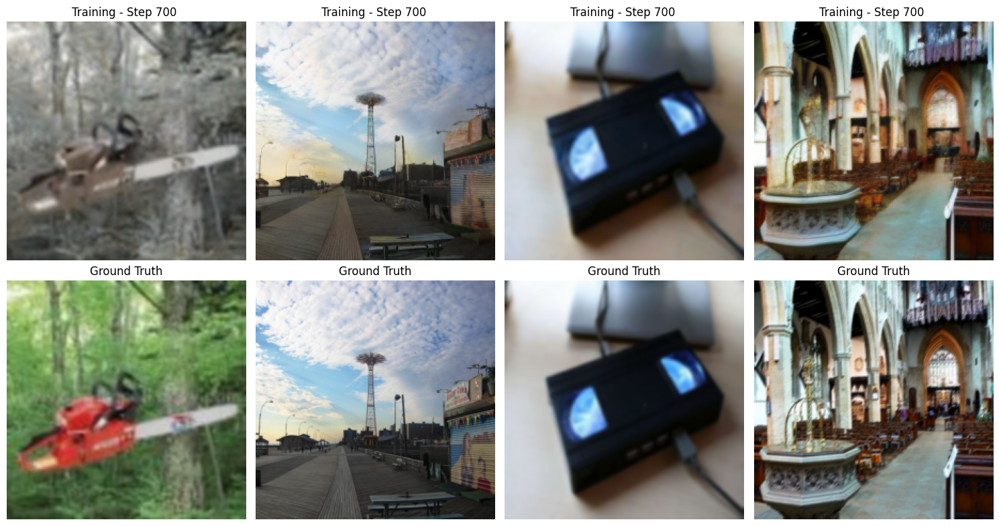

  Step 710 - Training Loss: 0.050926
  Step 760 - Training Loss: 0.042009
tensor([[[[0.4251]]],


        [[[0.1331]]],


        [[[0.3995]]],


        [[[0.0152]]]], device='cuda:0')


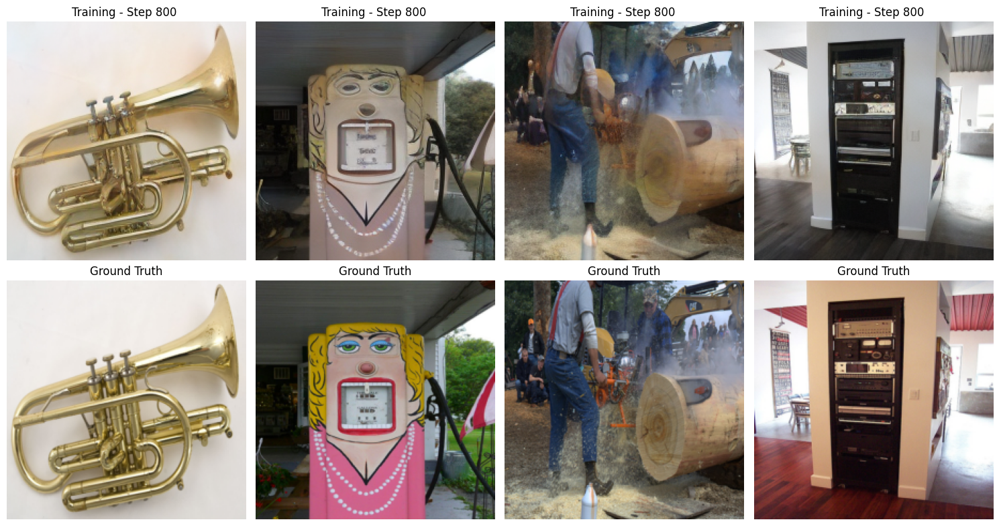

  Step 810 - Training Loss: 0.078603
  Step 860 - Training Loss: 0.039699
tensor([[[[0.1456]]],


        [[[0.2140]]],


        [[[0.0080]]],


        [[[0.2330]]]], device='cuda:0')


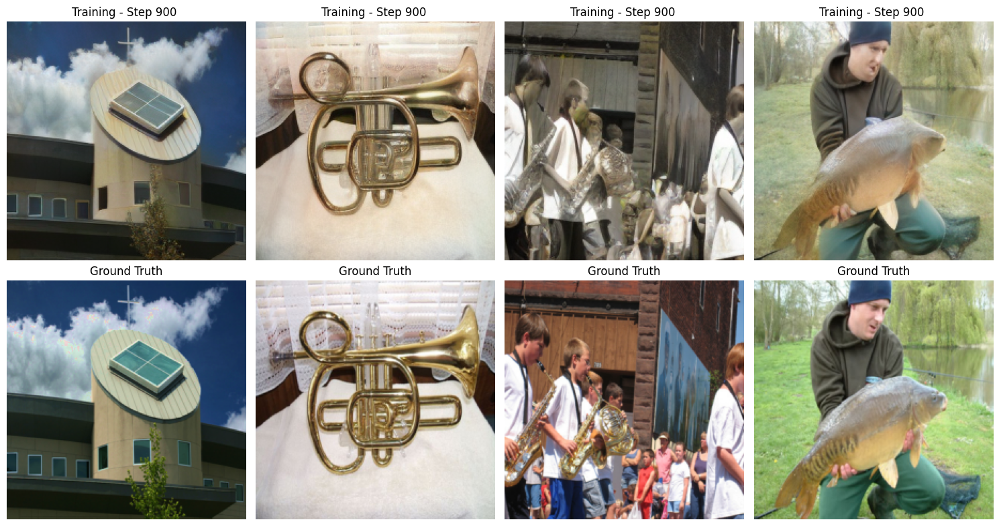

  Step 910 - Training Loss: 0.067715
  Step 960 - Training Loss: 0.064966

Performing validation at step 1000...


Validation:   0%|          | 0/49 [00:00<?, ?it/s]

tensor([[[[0.1430]]],


        [[[0.3096]]],


        [[[0.8964]]],


        [[[0.8243]]]], device='cuda:0')


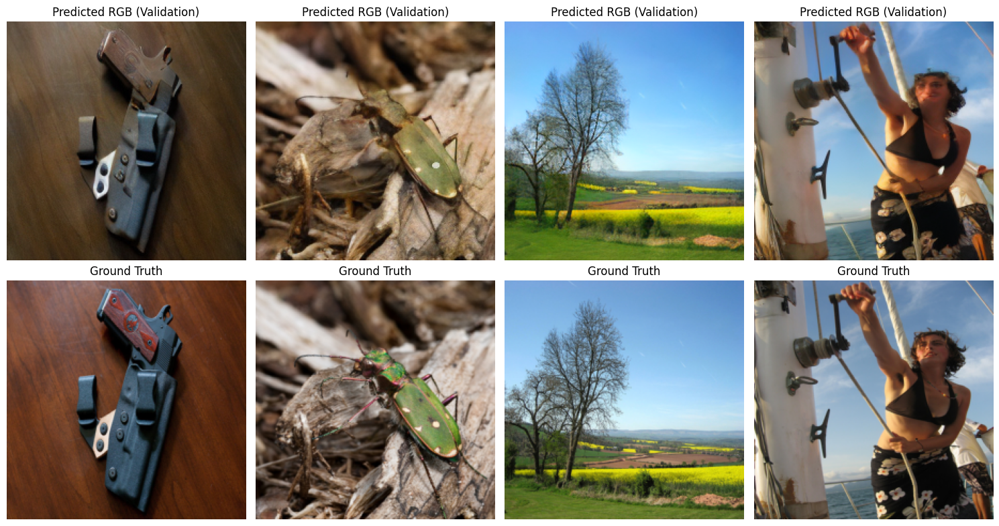

Step 1000 - Validation Loss: 0.042881
tensor([[[[0.1760]]],


        [[[0.3237]]],


        [[[0.3137]]],


        [[[0.0558]]]], device='cuda:0')


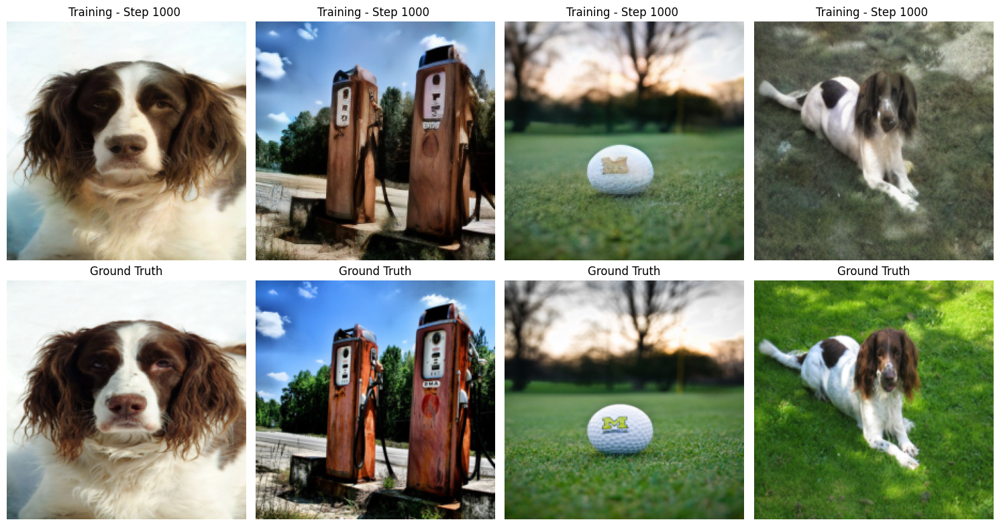

  Step 1010 - Training Loss: 0.057404
  Step 1060 - Training Loss: 0.064645
tensor([[[[0.4032]]],


        [[[0.0780]]],


        [[[0.9077]]],


        [[[0.4880]]]], device='cuda:0')


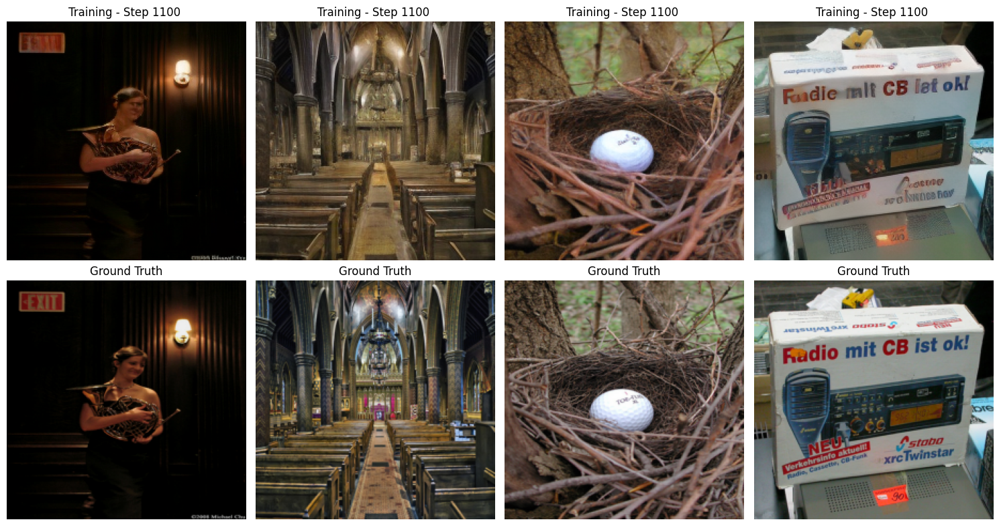

  Step 1110 - Training Loss: 0.089958
  Step 1160 - Training Loss: 0.057586
tensor([[[[9.4358e-07]]],


        [[[3.0113e-02]]],


        [[[8.7293e-04]]],


        [[[3.7130e-01]]]], device='cuda:0')


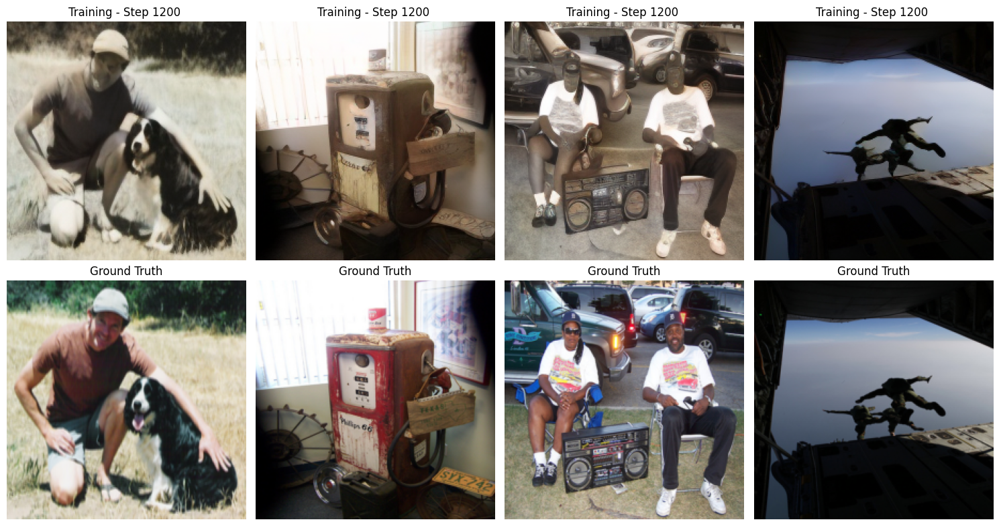

  Step 1210 - Training Loss: 0.078039
  Step 1260 - Training Loss: 0.076109
tensor([[[[0.8930]]],


        [[[0.1159]]],


        [[[0.0762]]],


        [[[0.2098]]]], device='cuda:0')


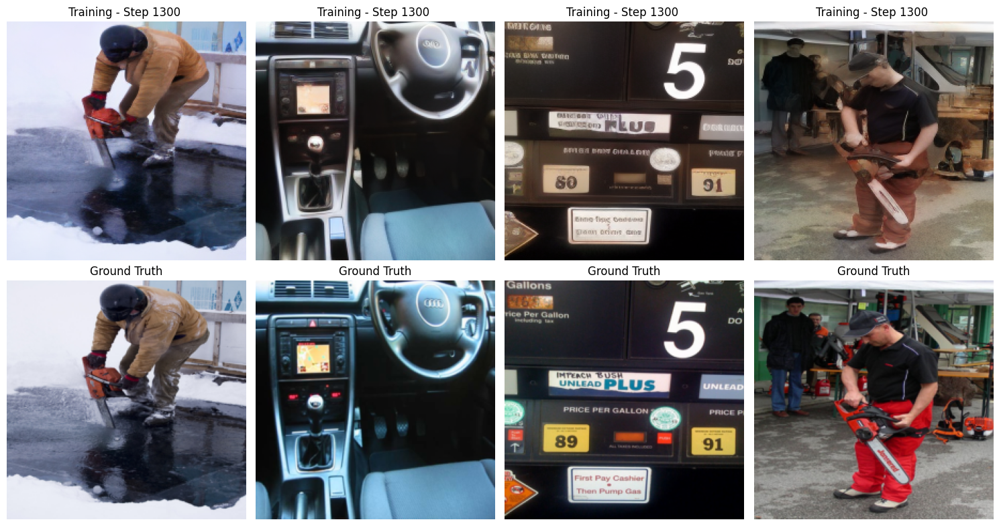

  Step 1310 - Training Loss: 0.117008
Epoch 2 - Average Training Loss: 0.070534
Checkpoint saved at /content/drive/MyDrive/checkpoints/latest_checkpoint.pth


In [44]:
# Initialize global step counter
global_step = 0

checkpoint_dir = "/content/drive/MyDrive/checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Define the path for the checkpoint
checkpoint_path = os.path.join(checkpoint_dir, "latest_checkpoint.pth")

# Optionally, load the checkpoint if it exists
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    unet_lora.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    global_step = checkpoint['global_step']
    print(f"Checkpoint loaded from {checkpoint_path}, resuming from epoch {start_epoch + 1}")
else:
    start_epoch = 0  # Start fresh if no checkpoint is found

for epoch in range(start_epoch,num_epochs):
    # Training phase
    unet_lora.train()
    epoch_loss = 0

    for batch_idx, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1} Training")):
        rgb_input, gray_input, caption = batch
        rgb_input, gray_input = rgb_input.to(device), gray_input.to(device)
        gray_input = gray_input.repeat(1, 3, 1, 1)

        # Encode both RGB and grayscale into latent space
        z_rgb = pipe.vae.encode(rgb_input).latent_dist.sample() * pipe.vae.config.scaling_factor
        z_gray = pipe.vae.encode(gray_input).latent_dist.sample() * pipe.vae.config.scaling_factor

        # Sample timestep
        # t_orig = torch.rand((batch_size,), device=device)
        # t = t_orig.view(-1, 1, 1, 1)
        transition_step = len(train_loader) * num_epochs // 2  # Transition halfway through training
        t_orig = get_timestep_sampling(batch_size, device, global_step, transition_step)
        t = t_orig.view(-1, 1, 1, 1)

        # Apply interpolation
        z_t = (1 - t) * z_gray + t * z_rgb

        # Caption encoding
        text_embeddings = pipe.text_encoder(
            pipe.tokenizer(
                caption,
                return_tensors="pt",
                padding="max_length",
                max_length=pipe.tokenizer.model_max_length
            ).input_ids.to(device)
        )[0].to(dtype=torch.float32)

        # Forward pass
        pred_residual = unet_lora(
            z_t.to(dtype=torch.float32),
            t_orig.to(dtype=torch.float32),
            encoder_hidden_states=text_embeddings.to(dtype=torch.float32),
            return_dict=False
        )[0]

        loss = F.mse_loss(z_rgb - z_t, pred_residual)
        #loss = F.mse_loss(z_rgb, (z_t + pred_residual)) OLD
        epoch_loss += loss.item()

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Showing results of training every 200 steps
        if global_step % 100 == 0:
          num_samples_to_show = min(4, pred_residual.shape[0])

          with torch.no_grad():
            # Restore latent color information
            pred_colored_latents = z_t + pred_residual

            # Decode to image space
            pred_rgb_images = pipe.vae.decode(
                (pred_colored_latents / pipe.vae.config.scaling_factor).to(dtype=torch.float32)
            ).sample

            pred_rgb_images = (pred_rgb_images / 2 + 0.5).clamp(0, 1)
            pred_rgb_images = pred_rgb_images.cpu().permute(0, 2, 3, 1).numpy()

            # Scale rgb_input to [0,1]
            rgb_input_display = (rgb_input / 2 + 0.5).clamp(0, 1)
            rgb_input_display = rgb_input_display.to('cpu', dtype=float).permute(0, 2, 3, 1)

            # Create visualization
            fig, axes = plt.subplots(2, num_samples_to_show, figsize=(15, 8))

            print(t[:4])
            for i in range(num_samples_to_show):
                axes[0, i].imshow(pred_rgb_images[i])
                axes[0, i].set_title(f"Training - Step {global_step} ")
                axes[0, i].axis("off")

                axes[1, i].imshow(rgb_input_display[i])
                axes[1, i].set_title("Ground Truth")
                axes[1, i].axis("off")

            plt.tight_layout()
            plt.show()

        global_step += 1

        if batch_idx % 50 == 0:
            print(f"  Step {global_step} - Training Loss: {loss.item():.6f}")


        # Perform validation every 500 steps
        if global_step % 500 == 0:
            print(f"\nPerforming validation at step {global_step}...")
            unet_lora.eval()
            val_loss = 0

            with torch.no_grad():
                for val_batch_idx, val_batch in enumerate(tqdm(val_loader, desc="Validation")):
                    rgb_input, gray_input, caption = val_batch
                    rgb_input, gray_input = rgb_input.to(device), gray_input.to(device)
                    gray_input = gray_input.repeat(1, 3, 1, 1)

                    # Encode both RGB and grayscale into latent space
                    z_rgb = pipe.vae.encode(rgb_input).latent_dist.sample() * pipe.vae.config.scaling_factor
                    z_gray = pipe.vae.encode(gray_input).latent_dist.sample() * pipe.vae.config.scaling_factor

                    # Sample timestep
                    t_orig = torch.rand((batch_size,), device=device)
                    t = t_orig.view(-1, 1, 1, 1)

                    # Apply interpolation
                    z_t = (1 - t) * z_gray + t * z_rgb

                    # Caption encoding
                    text_embeddings = pipe.text_encoder(
                        pipe.tokenizer(
                            caption,
                            return_tensors="pt",
                            padding="max_length",
                            max_length=pipe.tokenizer.model_max_length
                        ).input_ids.to(device)
                    )[0].to(dtype=torch.float32)

                    # Forward pass
                    pred_residual = unet_lora(
                        z_t.to(dtype=torch.float32),
                        t_orig.to(dtype=torch.float32),
                        encoder_hidden_states=text_embeddings.to(dtype=torch.float32),
                        return_dict=False
                    )[0]

                    val_loss += F.mse_loss(z_rgb, (z_t + pred_residual)).item()

                    # Visualize first batch of validation results
                    if val_batch_idx == 0:
                        num_samples_to_show = min(4, pred_residual.shape[0])

                        # Restore latent color information
                        pred_colored_latents = z_t + pred_residual

                        # Decode to image space
                        pred_rgb_images = pipe.vae.decode(
                            (pred_colored_latents / pipe.vae.config.scaling_factor).to(dtype=torch.float32)
                        ).sample

                        pred_rgb_images = (pred_rgb_images / 2 + 0.5).clamp(0, 1)
                        pred_rgb_images = pred_rgb_images.cpu().permute(0, 2, 3, 1).numpy()

                        # Scale rgb_input to [0,1]
                        rgb_input_display = (rgb_input / 2 + 0.5).clamp(0, 1)
                        rgb_input_display = rgb_input_display.to('cpu', dtype=float).permute(0, 2, 3, 1)

                        # Create visualization
                        fig, axes = plt.subplots(2, num_samples_to_show, figsize=(15, 8))

                        print(t[:4])
                        for i in range(num_samples_to_show):
                            axes[0, i].imshow(pred_rgb_images[i])
                            axes[0, i].set_title("Predicted RGB (Validation)")
                            axes[0, i].axis("off")

                            axes[1, i].imshow(rgb_input_display[i])
                            axes[1, i].set_title("Ground Truth")
                            axes[1, i].axis("off")

                        plt.tight_layout()
                        plt.show()

                avg_val_loss = val_loss / len(val_loader)
                print(f"Step {global_step} - Validation Loss: {avg_val_loss:.6f}")

            # Switch back to training mode
            unet_lora.train()

    avg_train_loss = epoch_loss / len(train_loader)
    print(f"Epoch {epoch+1} - Average Training Loss: {avg_train_loss:.6f}")

    # **Saving Checkpoint After Each Epoch**
    checkpoint = {
        'epoch': epoch + 1,  # Next epoch to resume from
        'model_state_dict': unet_lora.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'global_step': global_step,
        'avg_train_loss': avg_train_loss
    }

    torch.save(checkpoint, checkpoint_path)
    print(f"Checkpoint saved at {checkpoint_path}")

## Saving the model

In [45]:
from safetensors.torch import save_file

In [46]:
lora_weights = {name: param for name, param in unet_lora.named_parameters() if "lora" in name}
torch.save(lora_weights, "lora_weights.pth")

In [47]:
save_file(lora_weights, "lora_weights.safetensors")

In [48]:
unet_lora.save_pretrained("lora_unet_weights")

In [49]:
from huggingface_hub import HfApi
from peft import PeftModel

In [50]:
repo_id = "MarcoBrigo11/SD2-1_LoRA_Colorization_Imagenette_V3"

In [51]:
unet_lora.push_to_hub(repo_id)

adapter_model.safetensors:   0%|          | 0.00/24.5M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/MarcoBrigo11/SD2-1_LoRA_Colorization_Imagenette_V3/commit/255e05ea910f8b983591094b3f7e3592745c1cfa', commit_message='Upload model', commit_description='', oid='255e05ea910f8b983591094b3f7e3592745c1cfa', pr_url=None, repo_url=RepoUrl('https://huggingface.co/MarcoBrigo11/SD2-1_LoRA_Colorization_Imagenette_V3', endpoint='https://huggingface.co', repo_type='model', repo_id='MarcoBrigo11/SD2-1_LoRA_Colorization_Imagenette_V3'), pr_revision=None, pr_num=None)